# **1) Installing and Importing Libraries**

In [ ]:
! pip install geopandas -q
! pip install simple_colors -q
! pip install h2o -q
! pip install catboost -q

     |████████████████████████████████| 994 kB 5.3 MB/s 
     |████████████████████████████████| 6.3 MB 34.1 MB/s 
     |████████████████████████████████| 15.4 MB 39 kB/s 
     |████████████████████████████████| 175.8 MB 38 kB/s 
     |████████████████████████████████| 67.4 MB 30 kB/s 


In [ ]:
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import descartes
import geopandas as gpd
from shapely.geometry import Point, Polygon
import missingno as msno
from simple_colors import *
import seaborn as sns
import sklearn
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report
import h2o
h2o.init()

%matplotlib inline

Checking whether there is an H2O instance running at http://localhost:54321 ..... not found.
Attempting to start a local H2O server...
  Java Version: openjdk version "11.0.11" 2021-04-20; OpenJDK Runtime Environment (build 11.0.11+9-Ubuntu-0ubuntu2.18.04); OpenJDK 64-Bit Server VM (build 11.0.11+9-Ubuntu-0ubuntu2.18.04, mixed mode, sharing)
  Starting server from /usr/local/lib/python3.7/dist-packages/h2o/backend/bin/h2o.jar
  Ice root: /tmp/tmpr8qwzrjl
  JVM stdout: /tmp/tmpr8qwzrjl/h2o_unknownUser_started_from_python.out
  JVM stderr: /tmp/tmpr8qwzrjl/h2o_unknownUser_started_from_python.err
  Server is running at http://127.0.0.1:54321
Connecting to H2O server at http://127.0.0.1:54321 ... successful.


H2O_cluster_uptime:,03 secs
H2O_cluster_timezone:,Etc/UTC
H2O_data_parsing_timezone:,UTC
H2O_cluster_version:,3.34.0.1
H2O_cluster_version_age:,2 days
H2O_cluster_name:,H2O_from_python_unknownUser_94pftq
H2O_cluster_total_nodes:,1
H2O_cluster_free_memory:,3.172 Gb
H2O_cluster_total_cores:,2
H2O_cluster_allowed_cores:,2
H2O_cluster_status:,"locked, healthy"


# **2) Importing data**

In [ ]:
df_train = pd.read_csv('train_features.csv')
df_train_labels = pd.read_csv('train_labels.csv')

df_test = pd.read_csv('test_features.csv')

Concatenate both the train and text dataframes with a new column split for identification.

In [ ]:
df_train["split"] = "train"
df_test["split"] = "test"

df = df_train.append(df_test, ignore_index = True)

df_plot = df_train.copy(deep=True)
df_plot['status_group'] = df_train_labels['status_group'].tolist()

df_plot is created for visualization.

# **3) Data Cleaning and Pre-processing**

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74250 entries, 0 to 74249
Data columns (total 41 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   id                     74250 non-null  int64  
 1   amount_tsh             74250 non-null  float64
 2   date_recorded          74250 non-null  object 
 3   funder                 69746 non-null  object 
 4   gps_height             74250 non-null  int64  
 5   installer              69718 non-null  object 
 6   longitude              74250 non-null  float64
 7   latitude               74250 non-null  float64
 8   wpt_name               74250 non-null  object 
 9   num_private            74250 non-null  int64  
 10  basin                  74250 non-null  object 
 11  subvillage             73780 non-null  object 
 12  region                 74250 non-null  object 
 13  region_code            74250 non-null  int64  
 14  district_code          74250 non-null  int64  
 15  lg

## **3.1) Null Values**

Visualizing Null Values in the dataset

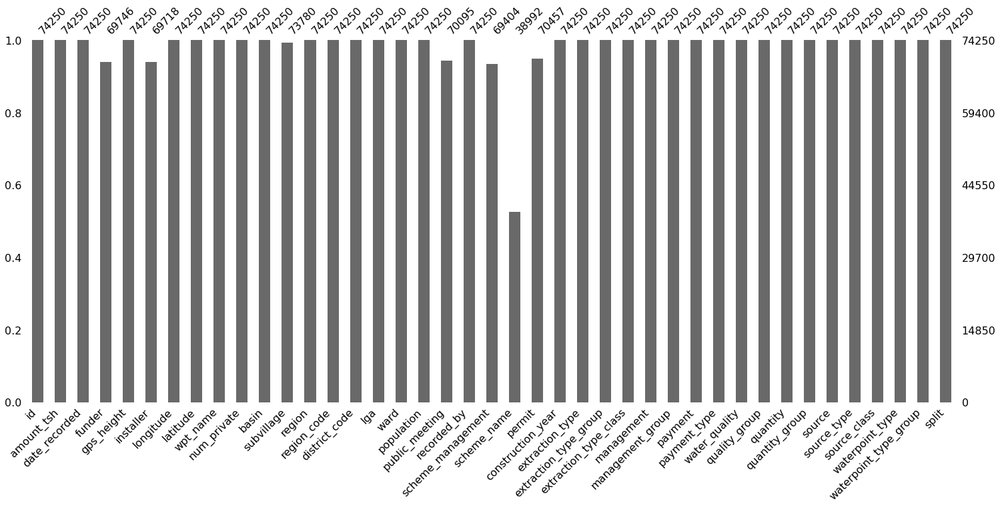

In [ ]:
msno.bar(df)

As seen there are null values in funder, installer, public_meeting, scheme_name, permit columns. We'll deal with them later in the notebook.

Next we look at the class distribution of the dataset.

## **3.2) Studying columns of similar nature**

In [ ]:
df_train_labels['status_group'].value_counts()

functional                 32259
non functional             22824
functional needs repair     4317
Name: status_group, dtype: int64

As we can see nearly 54% of the data is functional and 38% is non-functional leaving a mere 7% of the data points falling into functional needing repair.

The ones that are functional but need repair also comes under the functional data(if we consider this to be a binary classification problem).

---



The dataset has several columns out of which the following groups are similar,
1. scheme_management, management, management_group
2. quantity, quantity_group
3. source, source_type, source_class
4. water_quality, quality_group
5. payment, payment_type
6. extraction_type, extraction_type_group, extraction_type_class
7. waterpoint_type, waterpoint_type_group
8. region, region_code, district_code, longitude, latitude

We will individually look into these sets of columns.

### **3.2.1) scheme_Management, management and management_group**

First we will look at the unique values in these columns.

In [ ]:
location_columns = ['scheme_management', 'management', 'management_group']

for item in location_columns:
  print(green(item, 'bold') + ' : ' + str(df[item].nunique()))
  print(df[item].value_counts())
  print()

scheme_management : 12
VWC                 45917
WUG                  6496
Water authority      3975
WUA                  3551
Water Board          3462
Parastatal           2124
Company              1341
Private operator     1326
Other                 996
SWC                   123
Trust                  92
None                    1
Name: scheme_management, dtype: int64

management : 12
vwc                 50624
wug                  8108
water board          3688
wua                  3118
private operator     2504
parastatal           2229
water authority      1123
other                1083
company               859
unknown               683
other - school        126
trust                 105
Name: management, dtype: int64

management_group : 5
user-group    65538
commercial     4591
parastatal     2229
other          1209
unknown         683
Name: management_group, dtype: int64



Management and Scheme_mnagement have nearly same information. There are 3877 null values in scheme_management column therefore we will keep the management column.



---
When looking at the management group column, we group the management column with the management_group column to check if there are any groupings.


In [ ]:
df.groupby(['management_group','management']).count() 

id  ...  split
management_group management               ...       
commercial       company             859  ...    859
                 private operator   2504  ...   2504
                 trust               105  ...    105
                 water authority    1123  ...   1123
other            other              1083  ...   1083
                 other - school      126  ...    126
parastatal       parastatal         2229  ...   2229
unknown          unknown             683  ...    683
user-group       vwc               50624  ...  50624
                 water board        3688  ...   3688
                 wua                3118  ...   3118
                 wug                8108  ...   8108

[12 rows x 39 columns]

As we can see the management_group column is an aggregation of the management column. Since the management column has more detail its better to keep the management column.

**Column/s Removed: scheme_management, management_group**

### **3.2.2) region, region_code, district_code, lga, ward, subvillage, longitude, latitude**

All these columns contain geographical data, we should inspect these to find out if we need all of them.

First we will check the value counts and unique values per column.

In [ ]:
location_columns = ['region', 'region_code', 'district_code', 'lga', 'ward']

for item in location_columns:
  print(green(item, 'bold') + ' : ' + str(df[item].nunique()))
  print(df[item].value_counts())
  print()

region : 21
Iringa           6599
Shinyanga        6293
Mbeya            5758
Kilimanjaro      5494
Morogoro         5038
Kagera           4174
Arusha           4111
Mwanza           3897
Kigoma           3533
Pwani            3331
Ruvuma           3306
Tanga            3186
Dodoma           2779
Singida          2536
Tabora           2466
Mara             2451
Rukwa            2242
Mtwara           2144
Manyara          1972
Lindi            1920
Dar es Salaam    1020
Name: region, dtype: int64

region_code : 27
11    6608
17    6334
12    5759
3     5494
5     5079
18    4183
19    3824
2     3709
16    3533
10    3306
4     3145
1     2779
13    2536
14    2488
20    2451
15    2242
6     2032
21    1972
80    1536
60    1298
90    1133
7     1020
99     512
9      499
24     402
8      375
40       1
Name: region_code, dtype: int64

district_code : 20
1     15299
2     13929
3     12521
4     11253
5      5428
6      5108
7      4166
8      1282
30     1256
33     1063
53      921


Accordingly **region contains 21** distinct values, **region_code contains 27**, **district_code contains 20**, **lga contains 125** and finally **ward contains 2092**.

We will try and group certain columns and check. During grouping I found that lga can be grouped by region. Since both contain 0 null values and since lga contains 125 distinct values compared to region I thought of taking in region to reduce the errors.

In [ ]:
df.groupby(['region','lga']).count() 

id  amount_tsh  ...  waterpoint_type_group  split
region lga                             ...                              
Arusha Arusha Rural  1521        1521  ...                   1521   1521
       Arusha Urban    82          82  ...                     82     82
       Karatu         402         402  ...                    402    402
       Longido        391         391  ...                    391    391
       Meru          1244        1244  ...                   1244   1244
...                   ...         ...  ...                    ...    ...
Tanga  Lushoto        870         870  ...                    870    870
       Mkinga         347         347  ...                    347    347
       Muheza         424         424  ...                    424    424
       Pangani        375         375  ...                    375    375
       Tanga          121         121  ...                    121    121

[125 rows x 39 columns]

Next we try to visualize the locations of the data points using a scatter plot.

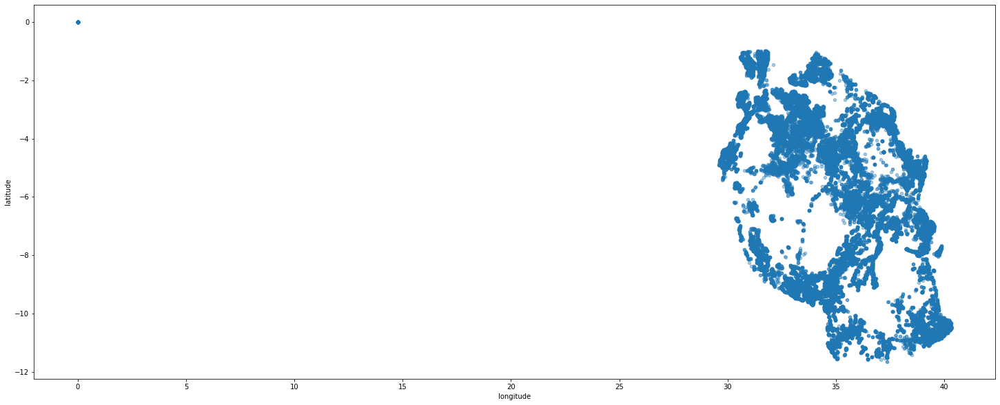

In [ ]:
df.plot(kind='scatter', x="longitude", y="latitude", alpha=0.4, figsize=(25,10),sharex=False)

As we can see there is a set of outliers in the dataset. This is due to the fact that certain longitude values are 0s. We need to recitfy this issue. 

To replace this zero values, we will first group the dataframe using lga, which is a geographical location and then by status_group. Then I fill in the values of each datapoint by the mean of the groups they belong to.

In [ ]:
longitude_non_zeroes = df.loc[df['longitude']!=0] # rows with non zero value for longitude
# longitude_groups_lga_status = longitude_non_zeroes.groupby(['lga','status_group']) # group these rows by lga and then status group
# longitude_groups_lga = longitude_non_zeroes.groupby(['lga'])   
longitude_groups_region_status= longitude_non_zeroes.groupby(['region_code']) 

'''
  Next we run a loop through all the datapooints, 
  check if the longitude is zero,
  and if so replace it 
'''

for i in range(len(df)):

  if df['longitude'][i] == 0:
    # try:
    #   df['longitude'][i] == longitude_groups_lga_status.get_group((df['lga'][i], df['status_group'][i]))['longitude'].mean()
    # except KeyError:
    #   df['longitude'][i] == longitude_groups_lga.get_group(df['lga'][i])['longitude'].mean()
    df['longitude'][i] = longitude_groups_region_status.get_group(df['region_code'][i])['longitude'].median()

Now since we filled in the 0 values, lets go ahead and visualize the new points on a mao of Tanzania, so that we can check for further outliers.

I will be using geopandas for visualization.

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:19: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/usr/local/lib/python3.7/dist-packages/pyproj/crs/crs.py:131: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)


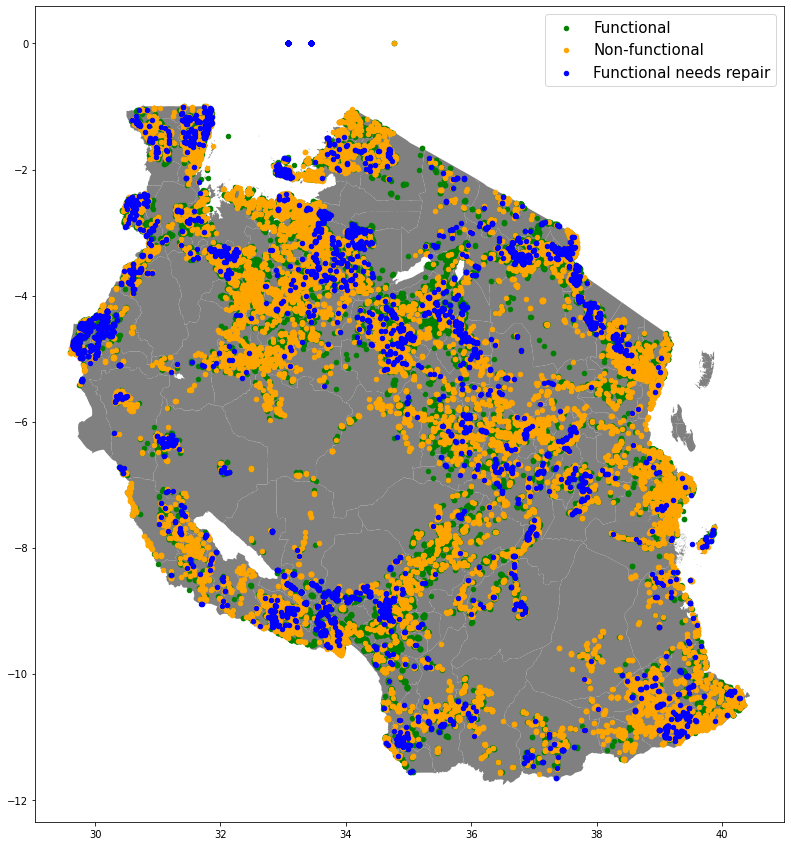

In [ ]:
longitude_non_zeroes = df_plot.loc[df_plot['longitude']!=0] # rows with non zero value for longitude
# longitude_groups_lga_status = longitude_non_zeroes.groupby(['lga','status_group']) # group these rows by lga and then status group
# longitude_groups_lga = longitude_non_zeroes.groupby(['lga'])   
longitude_groups_region_status= longitude_non_zeroes.groupby(['region_code']) 

'''
  Next we run a loop through all the datapooints, 
  check if the longitude is zero,
  and if so replace it 
'''

for i in range(len(df_plot)):

  if df_plot['longitude'][i] == 0:
    # try:
    #   df['longitude'][i] == longitude_groups_lga_status.get_group((df['lga'][i], df['status_group'][i]))['longitude'].mean()
    # except KeyError:
    #   df['longitude'][i] == longitude_groups_lga.get_group(df['lga'][i])['longitude'].mean()
    df_plot['longitude'][i] = longitude_groups_region_status.get_group(df_plot['region_code'][i])['longitude'].median()

map = gpd.read_file(r"tza_admbnda_adm2_20181019.shp")

geometry = [Point(xy) for xy in zip(df_plot['longitude'], df_plot['latitude'])]

crs = {'init': 'epsg:4326'}
geo_df = gpd.GeoDataFrame(df_plot, crs = crs, geometry = geometry)

fig,ax = plt.subplots(figsize = (15,15))

map.plot(ax = ax, color = 'grey')

geo_df[geo_df['status_group'] == 'functional'].plot(ax=ax, markersize=20, color='green', marker='o', label='Functional')
geo_df[geo_df['status_group'] == 'non functional'].plot(ax=ax, markersize=20, color='orange', marker='o', label='Non-functional')
geo_df[geo_df['status_group'] == 'functional needs repair'].plot(ax=ax, markersize=20, color='blue', marker='o', label='Functional needs repair')
plt.legend(prop={'size': 15})

Looking at it even more closely, there are still more outliers, points that have a errornous latitude. I googled the popular cities in Tanzania and found that none of them have a latitude > -0.5, but our dataset seemed to have points with that value. Therefore cleaned them using the approach followed for longitude cleaning.

In [ ]:
latitude_non_zeroes = df.loc[df['latitude'] < -0.5] # rows with non zero value for longitude
# longitude_groups_lga_status = longitude_non_zeroes.groupby(['lga','status_group']) # group these rows by lga and then status group
# longitude_groups_lga = longitude_non_zeroes.groupby(['lga'])   
latitude_groups_region_status= latitude_non_zeroes.groupby(['region_code']) 

'''
  Next we run a loop through all the datapooints, 
  check if the longitude is zero,
  and if so replace it 
'''

for i in range(len(df)):

  if df['latitude'][i] > -0.5:
    # try:
    #   df['longitude'][i] == longitude_groups_lga_status.get_group((df['lga'][i], df['status_group'][i]))['longitude'].mean()
    # except KeyError:
    #   df['longitude'][i] == longitude_groups_lga.get_group(df['lga'][i])['longitude'].mean()
    df['latitude'][i] = latitude_groups_region_status.get_group(df['region_code'][i])['latitude'].median()

Location can be represented through different ways to the model.

We can pass in the coordinates as well a cluster of coordinates such as region, region_code etc. 

We will pass in the latitudes and longitudes for better accuracy and next we will check what we can use out of region, region_code, district_code and lga. I will not take in ward because of high cardinality. To check this I will cluster the latitude and longitudes using KMeans and use the silhouette scores and the inertia(elbow method). Using the graphs we could find the optimal solution.

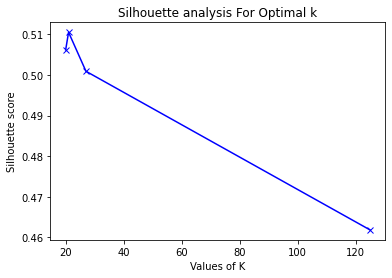

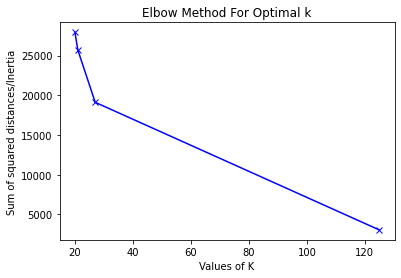

In [ ]:
X1 = df['longitude'].tolist()
X2 = df['latitude'].tolist()

data_frame = pd.DataFrame()
data_frame['X1'], data_frame['X2'] = X1, X2

range_n_clusters = [20, 21, 27, 125]
silhouette_avg = []

for num_clusters in range_n_clusters:
 # initialise kmeans
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(data_frame)
 cluster_labels = kmeans.labels_
 # silhouette score
 silhouette_avg.append(silhouette_score(data_frame, cluster_labels))

plt.plot(range_n_clusters,silhouette_avg,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Silhouette score') 
plt.title('Silhouette analysis For Optimal k')
plt.show()

Sum_of_squared_distances = []
K = [20, 21, 27, 125]
for num_clusters in K:
 kmeans = KMeans(n_clusters=num_clusters)
 kmeans.fit(data_frame)
 Sum_of_squared_distances.append(kmeans.inertia_)
plt.plot(K,Sum_of_squared_distances,'bx-')
plt.xlabel('Values of K') 
plt.ylabel('Sum of squared distances/Inertia') 
plt.title('Elbow Method For Optimal k')
plt.show()

The silhouette score gives preference to region whereas the elbow method prefers the region_code. 

Below are the regions in Tanzania, there are 30 in total.

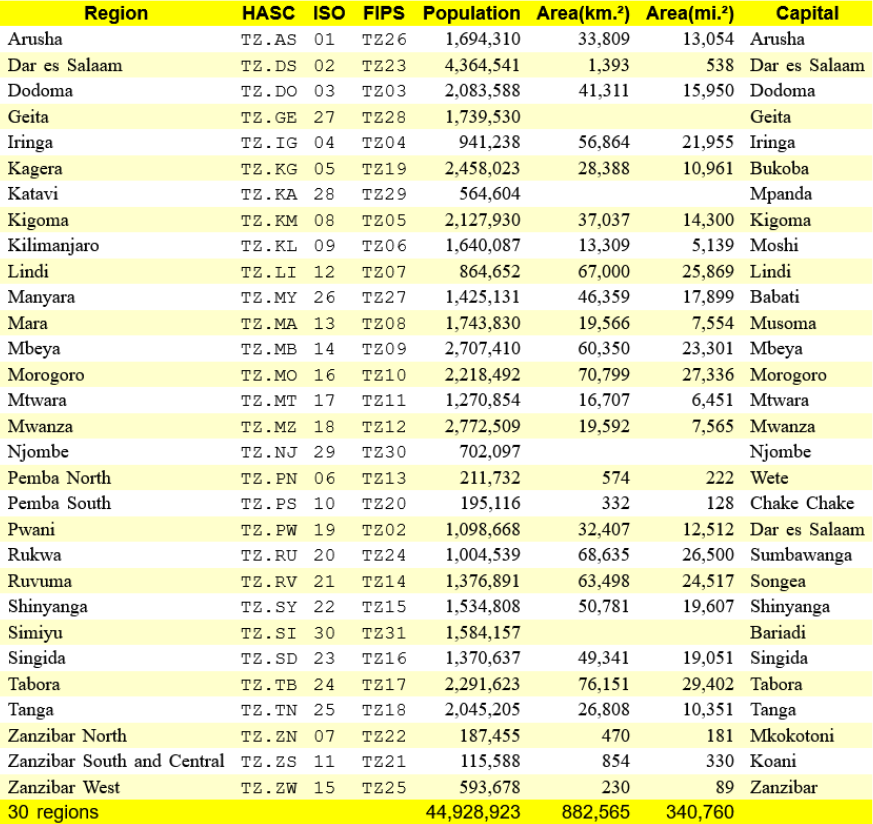

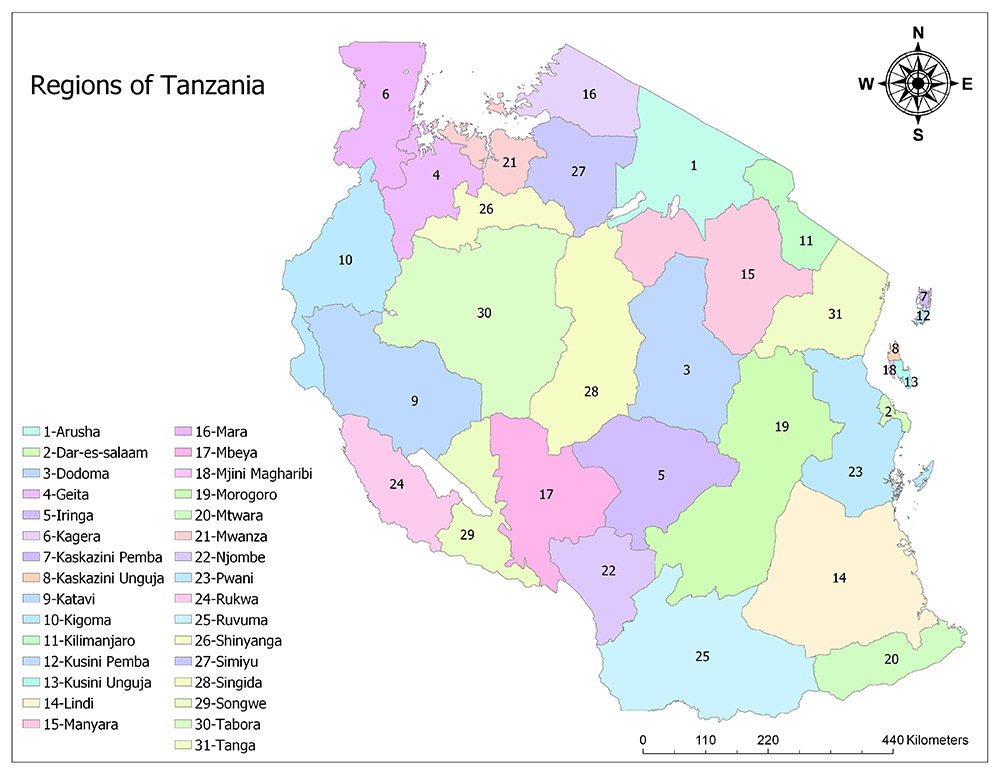

No we check which regions are not prevelant in our dataset. 

In [ ]:
regions_in_Tanazania = [
                          'Arusha', 'Dar es Salaam', 'Dodoma', 'Geita', 'Iringa', 'Kagera', 'Katavi', 'Kigoma', 'Kilimanjaro', 'Lindi', 'Manyara', 'Mara', 'Mbeya', 
                          'Morogoro', 'Mtwara', 'Mwanza', 'Njombe', 'Pemba North', 'Pemba South', 'Pwani', 'Rukwa', 'Ruvuma', 'Shinyanga', 'Simiyu', 'Singida', 'Tabora', 
                          'Tanga', 'Zanzibar Central/South', 'Zanzibar North', 'Zanzibar Urban/West'
                        ]

regions_in_dataset = df['region'].unique()

for item in regions_in_Tanazania:
  if item not in regions_in_dataset:
    print(item)

Geita
Katavi
Njombe
Pemba North
Pemba South
Simiyu
Zanzibar Central/South
Zanzibar North
Zanzibar Urban/West


We can clearly see that our dataset doesn't contain 9 regions. But when we observe the map plot of Tanzania we can see that there are location markers in all the regions.

This indicates that there are issues within the dataset. But we cannot rectify this because of several reasons(we can't accurately predict the regions of the coordinates because the coordinates themselves were not accurate).


Finally I decided on keeping latitude, longitude and region and drop the rest.

**Column/s Removed: scheme_management, management_group, region_code, lga, district_code, ward, subvillage**

### **3.2.3) quantity, quantity_group**

These columns also seem like they represent the same thing. We will explore them in detail. (Both have zero null values)

In [ ]:
quantity_columns = ['quantity', 'quantity_group']

for item in quantity_columns:
  print(green(item, 'bold') + ' : ' + str(df[item].nunique()))
  print(df[item].value_counts())
  print()

quantity : 5
enough          41522
insufficient    18896
dry              7782
seasonal         5075
unknown           975
Name: quantity, dtype: int64

quantity_group : 5
enough          41522
insufficient    18896
dry              7782
seasonal         5075
unknown           975
Name: quantity_group, dtype: int64



As we can clearly see both these columns are exactly the same, i.e. they have the same information. We will keep the quantity column and drop the quantity_group column.

We will plot the quantity column along with the label to understand if there are any relationships.

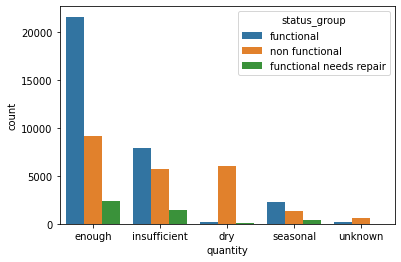

In [ ]:
ax = sns.countplot(x='quantity', hue="status_group", data=df_plot)

If the quantity == dry or unknown: then high probability of non functional.

If quantity == enough: high probability of functional.

This column seems to be highly correlated with the label.

**Column/s Removed: scheme_management, management_group, region_code, lga, district_code, ward, subvillage, quantity_group**

### **3.2.4) source, source_type, source_class**

These three columns seem to represent the same information therefore we will inspect further. (All three columns have 0 null values).

In [ ]:
source_columns = ['source', 'source_type', 'source_class']

for item in source_columns:
  print(green(item, 'bold') + ' : ' + str(df[item].nunique()))
  print(df[item].value_counts())
  print()

source : 10
spring                  21216
shallow well            21140
machine dbh             13822
river                   11964
rainwater harvesting     2863
hand dtw                 1108
lake                      950
dam                       840
other                     261
unknown                    86
Name: source, dtype: int64

source_type : 7
spring                  21216
shallow well            21140
borehole                14930
river/lake              12914
rainwater harvesting     2863
dam                       840
other                     347
Name: source_type, dtype: int64

source_class : 3
groundwater    57286
surface        16617
unknown          347
Name: source_class, dtype: int64



We can see that the information in all three columns are quite the same. We will group these columns to check the presence of hierarchies.

First we will group source_type by source_class.

In [ ]:
df.groupby(['source_class','source_type']).count()

id  ...  split
source_class source_type                  ...       
groundwater  borehole              14930  ...  14930
             shallow well          21140  ...  21140
             spring                21216  ...  21216
surface      dam                     840  ...    840
             rainwater harvesting   2863  ...   2863
             river/lake            12914  ...  12914
unknown      other                   347  ...    347

[7 rows x 39 columns]

Now we group source by source_type.

In [ ]:
df.groupby(['source_type','source']).count()

id  ...  split
source_type          source                       ...       
borehole             hand dtw               1108  ...   1108
                     machine dbh           13822  ...  13822
dam                  dam                     840  ...    840
other                other                   261  ...    261
                     unknown                  86  ...     86
rainwater harvesting rainwater harvesting   2863  ...   2863
river/lake           lake                    950  ...    950
                     river                 11964  ...  11964
shallow well         shallow well          21140  ...  21140
spring               spring                21216  ...  21216

[10 rows x 39 columns]

We can clearly observe a hierarchy in the columnns.

**source_class** -->> **source_type** -->> **source**

Now we will inspect whether source can be used for prediction.

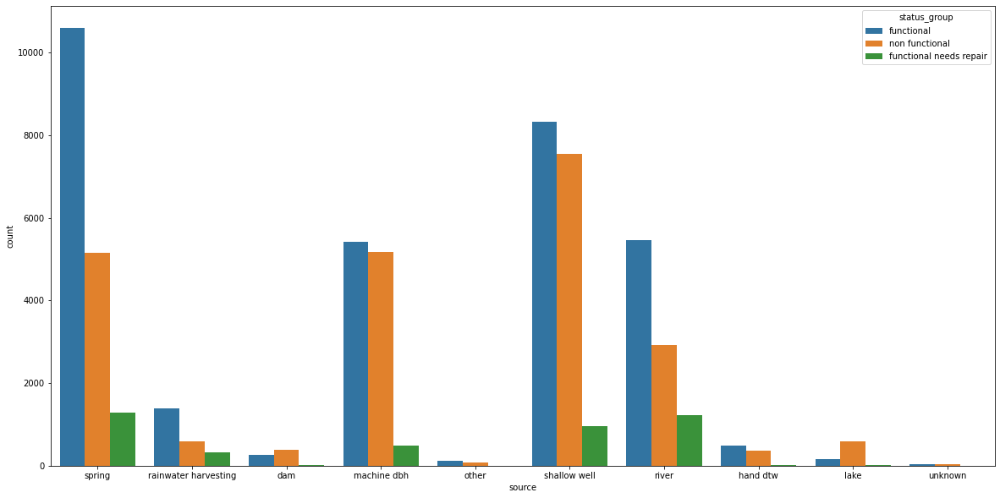

In [ ]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='source', hue="status_group", data=df_plot)

Using the plots only we cannot decide if there is a relationship between source and the label but I have decided to drop source_class and source_type and keep the source column.

**Column/s Removed: scheme_management, management_group, region_code, lga, district_code, ward, subvillage, quantity_group, source_type, source_class**

### **3.2.5) water_quality, quality_group**

Let's see if there are any relations between the columns.

In [ ]:
water_columns = ['water_quality', 'quality_group']

for item in water_columns:
  print(green(item, 'bold') + ' : ' + str(df[item].nunique()))
  print(df[item].value_counts())
  print()

water_quality : 8
soft                  63505
salty                  6082
unknown                2345
milky                  1005
coloured                623
salty abandoned         423
fluoride                244
fluoride abandoned       23
Name: water_quality, dtype: int64

quality_group : 6
good        63505
salty        6505
unknown      2345
milky        1005
colored       623
fluoride      267
Name: quality_group, dtype: int64



Both these columns have zero null values, and both these columns represent the same type of information.

Now we will check if there are any discrpenencies between the two columns. I will group the data by quality_group and then water_quality.

In [ ]:
df.groupby(['quality_group', 'water_quality']).mean()

id  ...  construction_year
quality_group water_quality                     ...                   
colored       coloured            36676.027287  ...         926.696629
fluoride      fluoride            40396.172131  ...        1647.729508
              fluoride abandoned  40408.347826  ...        1306.565217
good          soft                37091.925250  ...        1312.768695
milky         milky               36034.189055  ...         335.419900
salty         salty               37396.662118  ...        1371.303190
              salty abandoned     37451.664303  ...         979.404255
unknown       unknown             37455.554797  ...        1254.784648

[8 rows x 10 columns]

Since water_quality has more distinct values I will use it. 

**Column/s Removed: scheme_management, management_group, region_code, lga, district_code, ward, subvillage, quantity_group, source_type, source_class, quality_group**

### **3.2.6) payment, payment_type**

Let's see if there are any relations between the columns.

In [ ]:
payment_columns = ['payment', 'payment_type']

for item in payment_columns:
  print(green(item, 'bold') + ' : ' + str(df[item].nunique()))
  print(df[item].value_counts())
  print()

payment : 7
never pay                31712
pay per bucket           11266
pay monthly              10397
unknown                  10149
pay when scheme fails     4842
pay annually              4570
other                     1314
Name: payment, dtype: int64

payment_type : 7
never pay     31712
per bucket    11266
monthly       10397
unknown       10149
on failure     4842
annually       4570
other          1314
Name: payment_type, dtype: int64



As we can see both these columns have the same set of values. Therefore I will drop payment_type.

I will check if there are any relationship between payment and label.

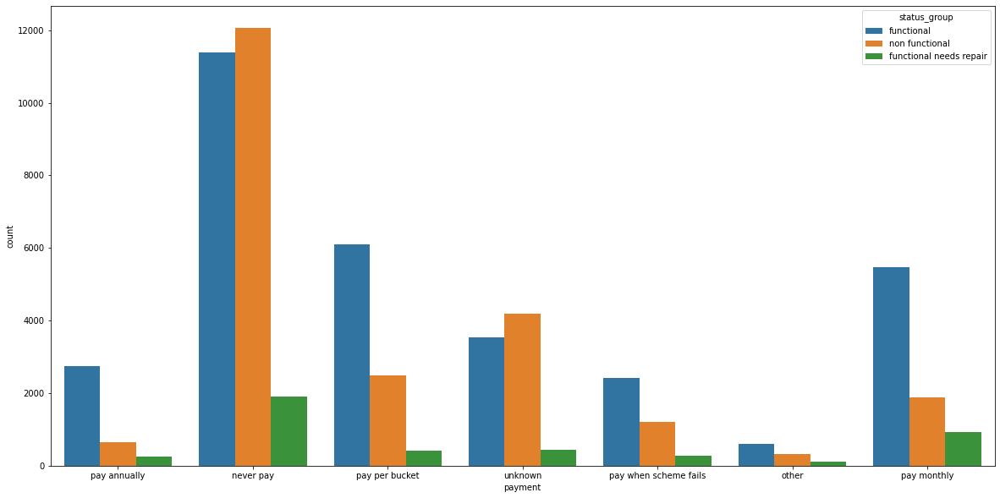

In [ ]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='payment', hue="status_group", data=df_plot)

If it is pay annually or pay per bucket or pay monthly: then functional.

If the pay is unknown or never pay: then non functional.

**Column/s Removed: scheme_management, management_group, region_code, lga, district_code, ward, subvillage, quantity_group, source_type, source_class, quality_group, payment_type**

### **3.2.7) extraction_type, extraction_type_group, extraction_type_class**

Let's see if there are any relations between the columns.

In [ ]:
extraction_columns = ['extraction_type', 'extraction_type_group', 'extraction_type_class']

for item in extraction_columns:
  print(green(item, 'bold') + ' : ' + str(df[item].nunique()))
  print(df[item].value_counts())
  print()

extraction_type : 18
gravity                      33263
nira/tanira                  10205
other                         8102
submersible                   5982
swn 80                        4588
mono                          3628
india mark ii                 3029
afridev                       2208
ksb                           1790
other - rope pump              572
other - swn 81                 284
windmill                       152
india mark iii                 135
cemo                           108
other - play pump              101
walimi                          60
climax                          41
other - mkulima/shinyanga        2
Name: extraction_type, dtype: int64

extraction_type_group : 13
gravity            33263
nira/tanira        10205
other               8102
submersible         7772
swn 80              4588
mono                3628
india mark ii       3029
afridev             2208
rope pump            572
other handpump       447
wind-powered         152
other moto

Let's check if there is a hierarchy between the columns.

In [ ]:
df.groupby(['extraction_type_class', 'extraction_type_group', 'extraction_type']).mean()

id  ...  construction_year
extraction_type_class extraction_type_group extraction_type                          ...                   
gravity               gravity               gravity                    37147.810480  ...        1487.634729
handpump              afridev               afridev                    37862.843750  ...        1093.601449
                      india mark ii         india mark ii              37419.644107  ...        1395.347970
                      india mark iii        india mark iii             38239.488889  ...        1232.074074
                      nira/tanira           nira/tanira                36936.897109  ...         689.301813
                      other handpump        other - mkulima/shinyanga  35372.500000  ...         985.500000
                                            other - play pump          37497.792079  ...        1110.148515
                                            other - swn 81             36730.880282  ...        1528.408451
                                            walimi                     36958.900000  ...          66.666667
                      swn 80                swn 80                     37359.727332  ...        1199.356800
motorpump             mono                  mono                       37527.011025  ...        1061.228225
                      other motorpump       cemo                       34193.194444  ...          37.175926
                                            climax                     29995.170732  ...         637.951220
other                 other                 other                      36556.724636  ...        1160.241052
rope pump             rope pump             other - rope pump          37817.194056  ...        1728.632867
submersible           submersible           ksb                        37353.042458  ...        1464.145251
                                            submersible                37270.618355  ...        1668.209295
wind-powered          wind-powered          windmill                   34110.901316  ...        1063.664474

[18 rows x 10 columns]

I was able to observe the following hierarchy among the classes.

**extraction_type_class** -->> **extraction_type_group** -->> **extraction_type**

We have to choose one column among these three. I chose the extraction_type_group column. I didn't choose the extraction_type column because of the small groups observed.

Next visualizing to check for correlations.

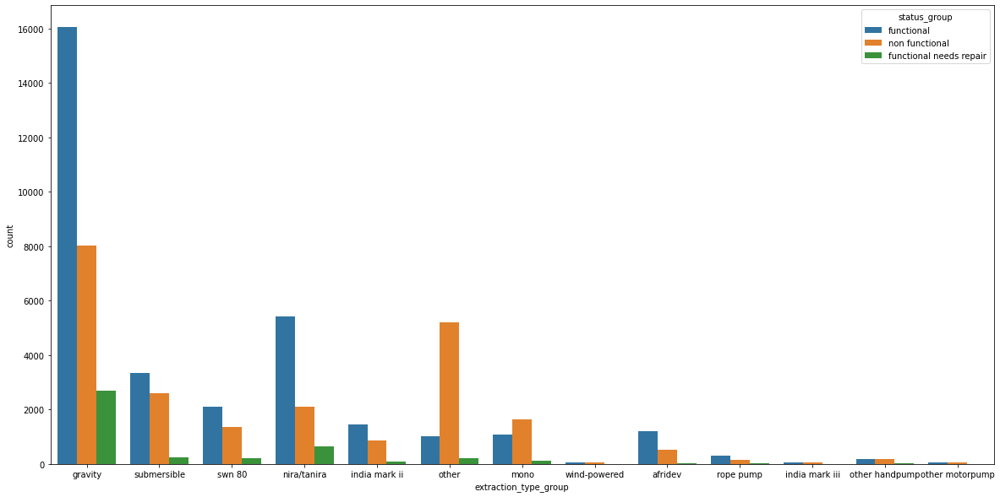

In [ ]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='extraction_type_group', hue="status_group", data=df_plot)

It can be observed that if the extraction type is gravity or nira/tanira: then mostly functional.

If extraction is other or mono: then mostly non functional.

**Column/s Removed: scheme_management, management_group, region_code, lga, district_code, ward, subvillage, quantity_group, source_type, source_class, quality_group, payment_type, extraction_type, extraction_type_class**

### **3.2.8) waterpoint_type, waterpoint_type_group**

Let's see if there are any relations between the columns.

In [ ]:
waterpoint_columns = ['waterpoint_type', 'waterpoint_type_group']

for item in waterpoint_columns:
  print(green(item, 'bold') + ' : ' + str(df[item].nunique()))
  print(df[item].value_counts())
  print()

df.groupby(['waterpoint_type_group', 'waterpoint_type']).mean()

waterpoint_type : 7
communal standpipe             35628
hand pump                      21884
other                           8010
communal standpipe multiple     7611
improved spring                  959
cattle trough                    150
dam                                8
Name: waterpoint_type, dtype: int64

waterpoint_type_group : 6
communal standpipe    43239
hand pump             21884
other                  8010
improved spring         959
cattle trough           150
dam                       8
Name: waterpoint_type_group, dtype: int64



id  ...  construction_year
waterpoint_type_group waterpoint_type                            ...                   
cattle trough         cattle trough                39383.933333  ...        1383.660000
communal standpipe    communal standpipe           37068.339284  ...        1496.615976
                      communal standpipe multiple  37425.672054  ...        1378.533701
dam                   dam                          42330.625000  ...        1496.875000
hand pump             hand pump                    37212.445668  ...        1003.897688
improved spring       improved spring              38687.982273  ...         945.594369
other                 other                        36613.155056  ...        1186.245443

[7 rows x 10 columns]

Both these columns are quite the same except fot communal stand pipe which is divided further into two in the waterpoint_type column.

To find out which is more suitable we will graph these two columns to see if the division of communal standpipe actually makes a difference.

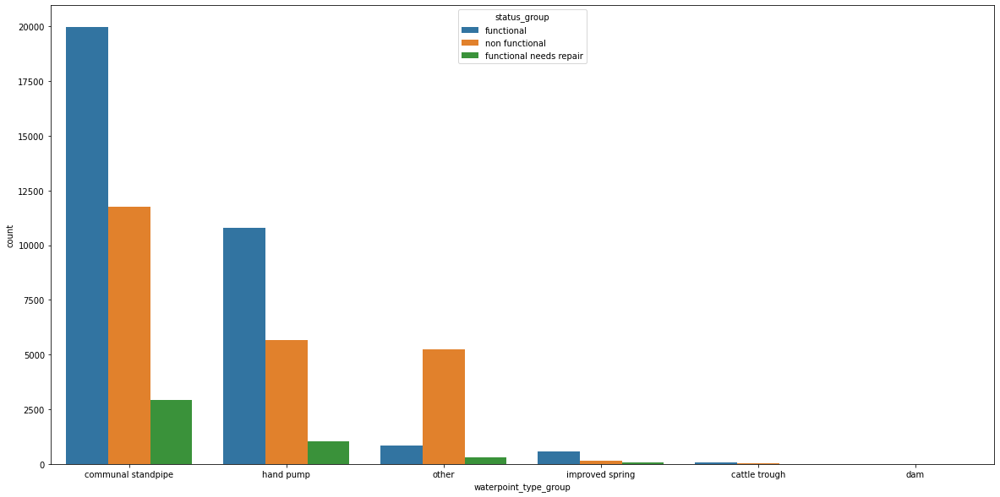

In [ ]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='waterpoint_type_group', hue="status_group", data=df_plot)

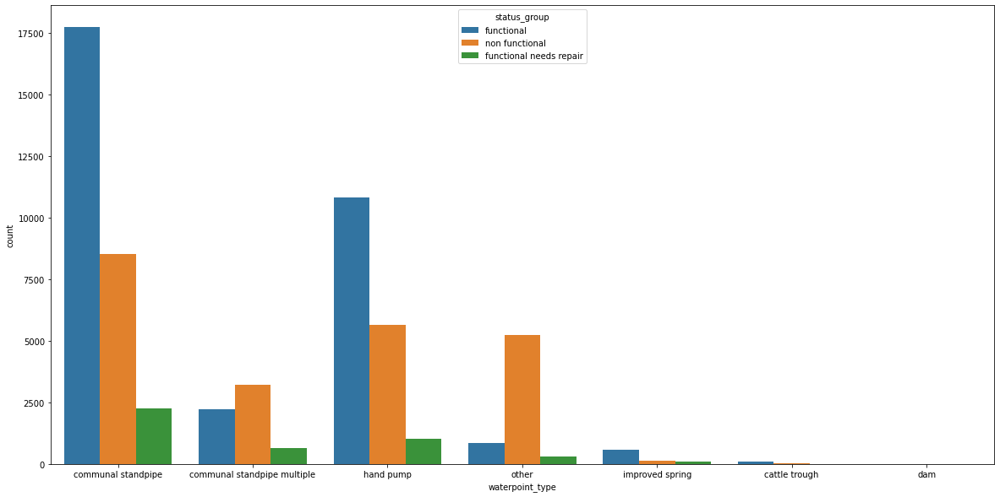

In [ ]:
plt.figure(figsize=(20,10))
ax = sns.countplot(x='waterpoint_type', hue="status_group", data=df_plot)

As we can see when we take only communal standpipe we come to the conclusion if that the waterpoint type is communal standpipe then there is high chance of it being functional. But when we do it more granularly we can see that the communal standpipe multiple has a high chance of being non functional. Therefore I will use the waterpoint_type column and drop the waterpoint_type_group column.

**Column/s Removed: scheme_management, management_group, region_code, lga, district_code, ward, subvillage, quantity_group, source_type, source_class, quality_group, payment_type, extraction_type, extraction_type_class, waterpoint_type_group**

## **3.3) Final step - dropping the similar columns**

In [ ]:
df.drop(columns=['scheme_management' , 'management_group' , 'region_code' , 'lga' , 
                 'district_code' , 'ward' , 'subvillage' , 'quantity_group' , 'source_type' , 
                 'source_class' , 'quality_group' , 'payment_type' , 'extraction_type' , 
                 'extraction_type_class' , 'waterpoint_type_group'], inplace=True)

# **4) Issues in other columns**

## **4.1) recorded_by column**

We wil inspect this column. First we will check the value counts in this column.

In [ ]:
df['recorded_by'].value_counts()

GeoData Consultants Ltd    74250
Name: recorded_by, dtype: int64

Here all the rows have the same value. Therefore, we can ommit this because it does not provide any detail to the model.

In [ ]:
df.drop(columns=['recorded_by'],inplace=True)

## **4.2) installer column**

This columns seems to have alot of zero and Null values. We will replace the 0 values and NULL values by a new category called "unknown".

When I inspected the values in the column I was able to find several spelling errors.

In [ ]:
# Replacing the spelling mistakes and collect same categories in same name

def replace_mistakes(df):

  df['installer'] = df['installer'].astype(str).str.lower()
  df['installer'].replace(
      to_replace=(
          'fini water', 'fin water', 'finn water', 'finwater', 'finwate'),
      value='finw', inplace=True)
  df['installer'].replace(to_replace=('jaica co'), value='jaica', inplace=True)
  df['installer'].replace(
      to_replace=(
          'district water department', 'district water depar', 'district council',
          'district counci', 'village council orpha','kibaha town council',
          'village council', 'coun', 'village counil', 'council',
          'mbulu district council', 'counc', 'village council .oda',
          'sangea district coun', 'songea district coun', 'villege council',
          'district  council', 'quick win project /council', 'mbozi district council',
          'village  council', 'municipal council', 'tabora municipal council',
          'wb / district council'),
      value='council', inplace=True)
  df['installer'].replace(
      to_replace=(
          'rc church', 'rc churc', 'rcchurch/cefa', 'irc', 'rc', 'rc ch', 'hw/rc',
          'rc church/central gover', 'kkkt church', 'pentecost church', 'roman church',
          'rc/mission', 'rc church/cefa', 'lutheran church', 'tag church',
          'free pentecoste church of tanz', 'rc c', 'church', 'rc cathoric',
          'morovian church', 'cefa/rc church', 'rc mission', 'anglican church',
          'church of disciples', 'anglikana church', 'cetral government /rc',
          'pentecostal church', 'cg/rc', 'rc missionary', 'sda church', 'methodist church', 'trc',
          'rc msufi', 'haidomu lutheran church', 'baptist church', 'rc church brother',
          'st magreth church', 'anglica church', 'global resource co', 'rc mi',
          'baptist church of tanzania', 'fpct church', 'rc njoro', 'rc .church',
          'rc mis', 'batist church', 'churc', 'dwe/anglican church','missi', 'mission',
          'ndanda missions', 'rc/mission', 'cvs miss', 'missionaries', 'hydom luthelani',
          'luthe', 'haydom lutheran hospital', 'lutheran', 'missio', 'germany missionary',
          'grail mission kiseki bar', 'missionary', 'heri mission', 'german missionsry',
          'wamissionari wa kikatoriki', 'neemia mission', 'wamisionari wa kikatoriki'),
      value='church', inplace=True)
  df['installer'].replace(
      to_replace=(
          'central government', 'gove', 'central govt', 'gover', 'cipro/government',
          'governme', 'adra /government', 'isf/government', 'adra/government',
          'government /tcrs', 'village govt', 'government', 'government /community',
          'concern /government', 'goverm', 'village government', 'cental government',
          'govern', 'cebtral government', 'government /sda', 'tcrs /government',
          'tanzania government', 'centra govt', 'colonial government', 'misri government',
          'government and community', 'cetral government /rc', 'concern/government',
          'government of misri', 'lwi &central government', 'governmen', 'government/tcrs', 'government /world vision',
          'centra government'),
      value='tanzanian government', inplace=True)
  df['installer'].replace(
      to_replace=(
          'world vission', 'world division', 'word divisio','world visiin'),
      value='world vision', inplace=True)
  df['installer'].replace(to_replace=('unicrf'), value='unicef', inplace=True)
  df['installer'].replace(
      to_replace=(
          'commu', 'olgilai village community', 'adra /community', 'adra/community',
          'rwe/ community', 'killflora /community', 'communit', 'taboma/community',
          'arab community', 'adra/ community', 'sekei village community', 'rwe/community',
          'arabs community', 'village community', 'government /community',
          'dads/village community', 'killflora/ community', 'mtuwasa and community',
          'rwe /community', 'ilwilo community', 'summit for water/community',
          'igolola community', 'ngiresi village community', 'rwe community',
          'african realief committe of ku', 'twesa /community', 'shelisheli commission',
          'twesa/ community', 'marumbo community', 'government and community',
          'community bank', 'kitiangare village community', 'oldadai village community',
          'twesa/community', 'tlc/community', 'maseka community', 'islamic community',
          'district community j', 'village water commission', 'village community members',
          'tcrs/village community', 'village water committee', 'comunity'),
      value='community', inplace=True)
  df['installer'].replace(
      to_replace=(
          'danid', 'danda','danida co', 'danny', 'daniad', 'dannida', 'danids'),
      value='danida', inplace=True)
  df['installer'].replace(
      to_replace=(
          'hesaws', 'huches', 'hesaw', 'hesawz', 'hesawq', 'hesewa'),
      value='hesawa', inplace=True)
  df['installer'].replace(
      to_replace=(
          'dwsp', 'kkkt _ konde and dwe', 'rwe/dwe', 'rwedwe', 'dwe/', 'dw', 'dwr',
          'dwe}', 'dwt', 'dwe /tassaf', 'dwe/ubalozi wa marekani', 'consultant and dwe',
          'dwe & lwi', 'ubalozi wa marekani /dwe', 'dwe&', 'dwe/tassaf', 'dw$',
          'dw e', 'tcrs/dwe', 'dw#', 'dweb', 'tcrs /dwe', 'water aid/dwe', 'dww'),
      value='dwe', inplace=True)
  df['installer'].replace(
      to_replace=(
          'africa muslim', 'muslimu society(shia)', 'africa muslim agenc',
          'african muslims age', 'muslimehefen international','islamic',
          'the isla', 'islamic agency tanzania',  'islam', 'nyabibuye islamic center'),
      value='muslims', inplace=True)
  df['installer'].replace(
      to_replace=(
          'british colonial government', 'british government', 'britain'),
      value='british', inplace=True)
  df['installer'].replace(
      to_replace=(
          'tcrs/tlc', 'tcrs /care', 'cipro/care/tcrs', 'tcrs kibondo', 'tcrs.tlc',
          'tcrs /twesa', 'tassaf /tcrs', 'tcrs/care', 'tcrs twesa', 'rwe/tcrs',
          'tcrs/twesa', 'tassaf/ tcrs', 'tcrs/ tassaf', 'tcrs/ twesa', 'tcrs a',
          'tassaf/tcrs'),
      value='tcrs', inplace=True)
  df['installer'].replace(
      to_replace=(
          'kkkt-dioces ya pare', 'kkkt leguruki', 'kkkt ndrumangeni', 'kkkt dme',
          'kkkt kilinga', 'kkkt canal', 'kkkt katiti juu', 'kkkt mareu'),
      value='kkkt', inplace=True)
  df['installer'].replace(to_replace=('norad/'), value='norad', inplace=True)
  df['installer'].replace( to_replace=('tasaf/dmdd', 'dmdd/solider'),
      value='dmdd', inplace=True)
  df['installer'].replace(
      to_replace=('cjejow construction', 'cjej0'), value='cjejow', inplace=True)
  df['installer'].replace(
      to_replace=(
          'china henan constuction', 'china henan contractor', 'china co.', 'chinese'),
      value='china', inplace=True)
  df['installer'].replace(
      to_replace=(
          'local contract', 'local technician', 'local', 'local  technician',
          'locall technician', 'local te', 'local technitian', 'local technical tec',
          'local fundi', 'local technical', 'localtechnician', 'village local contractor',
          'local l technician'),
      value='local', inplace=True)
  df['installer'].replace(
      to_replace=(
          'oikos e .africa', 'oikos e.africa', 'africa amini alama',
          'africa islamic agency tanzania', 'africare', 'african development foundation',
          'oikos e. africa', 'oikos e.afrika', 'afroz ismail', 'africa', 'farm-africa',
          'oikos e africa', 'farm africa', 'africaone', 'tina/africare', 'africaone ltd',
          'african reflections foundation', 'africa m'),
      value='africa', inplace=True)
  df['installer'].replace(to_replace=('0', 'nan', '-'), value='other', inplace=True)
  df_installer_cnt = df.groupby('installer')['installer'].count()
  other_list = df_installer_cnt[df_installer_cnt<71].index.tolist()
  df['installer'].replace(to_replace=other_list, value='other', inplace=True)

  return df

df = replace_mistakes(df)

We get the values that occur more than 71 times and the rest are renamed as other.

## **4.3) funder column**

Similar to the installer column we will replace the 0 values and NULL values by a new category called "Unknown" and correct spelling.

In [ ]:
df['funder'] = df['funder'].astype(str).str.lower()
df['funder'].replace(
    to_replace=(
        'kkkt_makwale', 'kkkt-dioces ya pare', 'world vision/ kkkt', 'kkkt church',
        'kkkt leguruki', 'kkkt ndrumangeni', 'kkkt dme', 'kkkt canal', 'kkkt usa',
        'kkkt mareu'),
    value='kkkt', inplace=True)
df['funder'].replace(
    to_replace=(
        'government of tanzania', 'norad /government', 'government/ community',
        'cipro/government', 'isf/government', 'finidagermantanzania govt',
        'government /tassaf', 'finida german tanzania govt', 'village government',
        'tcrs /government', 'village govt', 'government/ world bank',
        'danida /government', 'dhv/gove', 'concern /govern', 'vgovernment',
        'lwi & central government', 'government /sda', 'koica and tanzania government',
        'world bank/government', 'colonial government', 'misri government',
        'government and community', 'concern/governm', 'government of misri',
        'government/tassaf', 'government/school', 'government/tcrs', 'unhcr/government',
        'government /world vision', 'norad/government'),
    value='government', inplace=True)
df['funder'].replace(
    to_replace=(
        'british colonial government', 'japan government', 'china government',
        'finland government', 'belgian government', 'italy government',
        'irish government', 'egypt government', 'iran gover', 'swedish', 'finland'),
    value='foreign government', inplace=True)
df['funder'].replace(
    to_replace=(
        'rc church', 'anglican church', 'rc churc', 'rc ch', 'rcchurch/cefa',
        'irc', 'rc', 'churc', 'hw/rc', 'rc church/centr', 'pentecosta church',
        'roman church', 'rc/mission', "ju-sarang church' and bugango",
        'lutheran church', 'roman cathoric church', 'tag church ub', 'aic church',
        'free pentecoste church of tanz', 'tag church', 'fpct church', 'rc cathoric',
        'baptist church', 'morovian church', 'cefa/rcchurch', 'rc mission',
        'bukwang church saints', 'agt church', 'church of disciples', 'rc mofu',
        "gil cafe'church'", 'pentecostal church', 'bukwang church saint',
        'eung am methodist church', 'rc/dwe', 'cg/rc', 'eung-am methodist church',
        'rc missionary', 'sda church', 'methodist church', 'rc msufi',
        'haidomu lutheran church', 'nazareth church', 'st magreth church',
        'agape churc', 'rc missi', 'rc mi', 'rc njoro', 'world vision/rc church',
        'pag church', 'batist church', 'full gospel church', 'nazalet church',
        'dwe/anglican church', 'missi', 'mission', 'missionaries', 'cpps mission',
        'cvs miss', 'grail mission kiseki bar', 'shelisheli commission', 'missionary',
        'heri mission', 'german missionary', 'wamissionari wa kikatoriki',
        'rc missionary', 'germany missionary', 'missio', 'neemia mission', 'rc missi',
        'hydom luthelani', 'luthe', 'lutheran church',  'haydom lutheran hospital',
        'village council/ haydom luther', 'lutheran', 'haidomu lutheran church',
        'resolute golden pride project', 'resolute mininggolden pride',
        'germany cristians'),
    value='church', inplace=True)
df['funder'].replace(
    to_replace=(
        'olgilai village community', 'commu', 'community', 'arab community',
        'sekei village community', 'arabs community', 'village community',
        'mtuwasa and community', 'ilwilo community', 'igolola community',
        'ngiresi village community', 'marumbo community', 'village communi',
        'comune di roma', 'comunity construction fund', 'community bank',
        "oak'zion' and bugango b' commu", 'kitiangare village community',
        'oldadai village community', 'tlc/community', 'maseka community',
        'islamic community',  'tcrs/village community', 'buluga subvillage community',
        'okutu village community'),
    value='community', inplace=True)
df['funder'].replace(
    to_replace=(
        'council', 'wb / district council', 'cdtfdistrict council',
        'sangea district council', 'mheza distric counc', 'kyela council',
        'kibaha town council', 'swidish', 'mbozi district council', 
        'village council/ rose kawala',  'songea municipal counci',
        'quick win project /council', 'village council', 'villege council',
        'tabora municipal council', 'kilindi district co', 'kigoma municipal council',
        'district council', 'municipal council', 'district medical',
        'sengerema district council', 'town council', 'mkinga  distric cou',
        'songea district council', 'district rural project', 'mkinga distric coun',
        'dadis'),
    value='district', inplace=True)
df['funder'].replace(
    to_replace=(
        'tcrs.tlc', 'tcrs /care', 'tcrst', 'cipro/care/tcrs', 'tcrs/care', 'tcrs kibondo'),
    value='tcrs', inplace=True)
df['funder'].replace(
    to_replace=(
        'fini water', 'finw', 'fin water', 'finn water', 'finwater'),
    value='fini', inplace=True)
df['funder'].replace(
    to_replace=(
        'islamic', 'the isla', 'islamic found', 'islamic agency tanzania',
        'islam', 'muislam', 'the islamic', 'nyabibuye islamic center', 'islamic society', 'african muslim agency',
        'muslims', 'answeer muslim grou', 'muslimu society(shia)',
        'unicef/african muslim agency', 'muslim world', 'muslimehefen international',
        'shear muslim', 'muslim society'),
    value='islam', inplace=True)
df['funder'].replace(
    to_replace=('danida', 'ms-danish', 'unhcr/danida', 'tassaf/ danida'),
    value='danida', inplace=True)
df['funder'].replace(
    to_replace=(
        'hesawa', 'hesawz', 'hesaw', 'hhesawa', 'hesawwa', 'hesawza', 'hesswa',
        'hesawa and concern world wide'),
    value='hesawa', inplace=True)
df['funder'].replace(
    to_replace=('world vision/adra', 'game division', 'worldvision'),
    value='world vision', inplace=True)
df['funder'].replace(
    to_replace=(
        'germany republi', 'a/co germany', 'aco/germany', 'bingo foundation germany',
        'africa project ev germany', 'tree ways german'),
    value='germany', inplace=True)
df['funder'].replace(to_replace=('0', 'nan', '-'), value='other', inplace=True)
df_funder_cnt = df.groupby('funder')['funder'].count()
other_list = df_funder_cnt[df_funder_cnt<98].index.tolist()
df['funder'].replace(to_replace=other_list, value='other', inplace=True)

We will use the values that occur more than 98 times and rest as other.

## **4.4) construction_year column**

First we will check the value counts in this column.

In [ ]:
df['construction_year'].value_counts()

0       25969
2010     3314
2008     3243
2009     3196
2000     2578
2007     1960
2006     1892
2011     1591
2003     1579
2004     1417
2012     1347
2002     1343
1995     1283
2005     1275
1978     1267
1999     1222
1998     1190
1985     1177
1990     1176
1996     1020
1980     1005
1984      970
1994      940
1982      926
1972      892
1997      821
1974      814
1992      807
1993      745
2001      680
1988      657
1983      594
1975      561
1986      553
1976      525
1970      493
1991      407
1989      396
1987      370
1981      291
1977      247
1979      245
1973      227
2013      209
1971      177
1960      124
1963      107
1967      106
1968       93
1969       77
1964       48
1962       36
1961       28
1965       21
1966       19
Name: construction_year, dtype: int64

This column has alot of values. Therefore we could create a new column called decade and group these values into that group.

In [ ]:
def create_decade(df):

  df['decade'] = df['construction_year'] #creating new columns

  # dividing the column decades

  df['decade'].replace(to_replace = (1960,1961,1962,1963,1964,1965,1966,1967,1968,1969),
                          value ='1960s' , inplace=True)
  df['decade'].replace(to_replace = (1970,1971,1972,1973,1974,1975,1976,1977,1978,1979),
                          value ='1970s' , inplace=True)
  df['decade'].replace(to_replace = (1980,1981,1982,1983,1984,1985,1986,1987,1988,1989),
                          value ='1980s' , inplace=True)
  df['decade'].replace(to_replace = (1990,1991,1992,1993,1994,1995,1996,1997,1998,1999),
                          value ='1990s' , inplace=True)
  df['decade'].replace(to_replace = (2000,2001,2002,2003,2004,2005,2006,2007,2008,2009),
                          value ='2000s' , inplace=True)
  df['decade'].replace(to_replace = (2010,2011,2012,2013),
                          value ='2010s' , inplace=True)
  
  return df

df = create_decade(df)

I will rename 0 as unknown because we cannot definitely say about the year of contruction year of these data points (We can assume that if the construction_year is unknown then there is a high chance of it being functional).

In [ ]:
df['decade'].replace(to_replace = '0', value ='Unknown' , inplace=True)

In [ ]:
df.drop(columns=['construction_year'],inplace=True )

## **4.5) wpt_name, scheme_name, id columns**

When I inspected the values in these columns I couldn't find any connection with the label therefore I decided on dropping them.

In [ ]:
df.drop(columns=['wpt_name','scheme_name','id'],inplace=True )

## **4.6) date_recorded, num_private columns**

We will look into these columns as well. 

Both these columns can be dropped because they don't provide any useful information.

1.  num_private column contains alot of Null values and also has mostly zero values

2.  date_recorded column has values mostly between 2011-2013, therefore I decided to drop it.

In [ ]:
df.drop(columns=['date_recorded','num_private'],inplace=True )

## **4.7) amount_tsh column**

Total static head shows us the height of the flow from the surface. Let's explore the values in the column.

In [ ]:
df['amount_tsh'].value_counts()

0.0       52049
500.0      3874
50.0       3103
1000.0     1858
20.0       1812
          ...  
5400.0        1
59.0          1
12.0          1
220.0         1
2550.0        1
Name: amount_tsh, Length: 102, dtype: int64

As we can see nearly 2/3 of the dataset contains the value 0. But if tsh is 0 then there is no need for a pump, therefore these points are errorneous. We cannot fill 2/3 of a column, it will definitely reduce model accuracy, therefore we will drop this column.

In [ ]:
df.drop(columns=['amount_tsh'],inplace=True )

## **4.8) gps_height column**

GPS height shows the level of waterpoint above the sea level. Let us inspect the values in this column.

In [ ]:
df['gps_height'].value_counts()

 0       25649
-16         71
-15         69
-13         68
-19         65
         ...  
 2457        1
 2091        1
 2536        1
 2408        1
 2015        1
Name: gps_height, Length: 2456, dtype: int64

Here we have 20438 points which have 0, but this could simply mean that these points are at the sea level (these need not be errorneous). We will further group it by label and find the mean to check correlation.

In [ ]:
df_plot.groupby('status_group')[['gps_height']].mean()

,gps_height
status_group,
functional,740.131188
functional needs repair,627.607135
non functional,574.464774


As seen there is a distinct difference between the classes, therefore we will keep these columns.

## **4.9) population column**

Let's first check if there are zero values. If so we will group these zero values with the label

In [ ]:
df['population'].loc[df['population']==0].count()

26834

This is interesting because some functional points have zero population (Why have functional pumps in regions with zero population?). Therefore there is an error in this and we will have to correct it. To replace them we will replace using the region's population with the labels as well to get accurate replacements.

In [ ]:
population_groups = df.loc[df['population']!=0] # rows with non zero value for longitude
  
population_groups_region_status= population_groups.groupby(['region']) 

population_mean = df.loc[df['population']!=0]['population'].mean()

'''
  Next we run a loop through all the datapooints, 
  check if the longitude is zero,
  and if so replace it 
'''

for i in range(len(df)):

  if df['population'][i] == 0:
    try:
      df['population'][i] = population_groups_region_status.get_group(df['region'][i])['population'].mean()
    except KeyError:
      df['population'][i] = population_mean

## **4.10) public_meeting, permit columns**

Lets first look the distribution of values in these columns.

In [ ]:
print("Public Meeting")
print(df['public_meeting'].value_counts())
print()
print("Permit")
print(df['permit'].value_counts())

Public Meeting
True     63749
False     6346
Name: public_meeting, dtype: int64

Permit
True     48606
False    21851
Name: permit, dtype: int64


As we can see there are null values, we will fill them with the modes.

In [ ]:
df['public_meeting'].fillna(df['public_meeting'].mode()[0], inplace=True)
df['permit'].fillna(df['permit'].mode()[0], inplace=True)

Now we split the dataframe into train and test again.

In [ ]:
df_train = df.loc[df['split'] == 'train']
df_test = df.loc[df['split'] == 'test']

df_train.drop(columns=['split'],inplace=True )
df_test.drop(columns=['split'],inplace=True )

We split the train dataset here into train, test and validation to evaluate our model. We will split them without bias using stratify.

In [ ]:
labels = df_train_labels['status_group'].tolist()

X_train, X_rem, y_train, y_rem = train_test_split(df_train, df_train_labels['status_group'].tolist(), train_size=0.75, stratify = labels)

# Now since we want the valid and test size to be equal (10% each of overall data). 
# we have to define valid_size=0.5 (that is 50% of remaining data)
labels1=y_rem

test_size = 0.5
X_valid, X_test, y_valid, y_test = train_test_split(X_rem,y_rem, test_size=0.5, stratify = labels1)

In [ ]:
X_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 44550 entries, 35657 to 1886
Data columns (total 18 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   funder                 44550 non-null  object 
 1   gps_height             44550 non-null  int64  
 2   installer              44550 non-null  object 
 3   longitude              44550 non-null  float64
 4   latitude               44550 non-null  float64
 5   basin                  44550 non-null  object 
 6   region                 44550 non-null  object 
 7   population             44550 non-null  int64  
 8   public_meeting         44550 non-null  bool   
 9   permit                 44550 non-null  bool   
 10  extraction_type_group  44550 non-null  object 
 11  management             44550 non-null  object 
 12  payment                44550 non-null  object 
 13  water_quality          44550 non-null  object 
 14  quantity               44550 non-null  object 
 15 

# **5) Training H2O**

First we create an H2O frame using the train test and validation splits.

Next we convert the categorical columns to enum.

In [ ]:
X_train_H2O = X_train.copy(deep=True)
X_train_H2O['status_group'] = y_train

X_valid_H2O = X_valid.copy(deep=True)
X_valid_H2O['status_group'] = y_valid

hf_train = h2o.H2OFrame(X_train_H2O)
hf_valid = h2o.H2OFrame(X_valid_H2O)
hf_test = h2o.H2OFrame(X_test)

cat_columns = ['status_group', 'funder', 'installer', 'basin', 'region', 'extraction_type_group', 'management', 'payment', 'water_quality', 'quantity', 'source', 'waterpoint_type', 'decade']

hf_train[cat_columns] = hf_train[cat_columns].asfactor()
hf_valid[cat_columns] = hf_valid[cat_columns].asfactor()
cat_columns.remove('status_group')
hf_test[cat_columns] = hf_test[cat_columns].asfactor()

Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%
Parse progress: |████████████████████████████████████████████████████████████████| (done) 100%


Next we use the autoML pipeline of H2O to fit the data and find the best model.

In [ ]:
from h2o.automl import H2OAutoML

x = hf_train.columns
x.remove('status_group')

aml = H2OAutoML(max_models = 30, seed = 42, verbosity="info", nfolds=3)

aml.train(x = x, y = 'status_group', training_frame = hf_train, validation_frame=hf_valid)

Using the best model we predict the test set and calculate the accuracy.

In [ ]:
pred=aml.leader.predict(hf_test)
pred.head()
h2o_result_as_df = pred.as_data_frame()

In [ ]:
y_pred = h2o_result_as_df['predict'].tolist()

from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.8075420875420876

# **6) CatBoost** 

Here we will use CatBoost, 

1. class weights were assigned to the model to handle the imbalance
2. categorical features were explicitly specified
3. The best model was chosen

In [ ]:
from catboost import CatBoostClassifier
from sklearn.utils.class_weight import compute_class_weight

categorical_features = ['funder', 'installer', 'basin', 'region', 'extraction_type_group', 'management', 'payment', 'water_quality', 'quantity', 'source', 'waterpoint_type', 'decade']

classes = np.unique(y_train)
weights = compute_class_weight(class_weight='balanced', classes=classes, y=y_train)
class_weights = dict(zip(classes, weights))


model = CatBoostClassifier(
    loss_function='MultiClass', 
    task_type="GPU",
    iterations=10000,
    eval_metric='Accuracy',
    # class_weights=class_weights
    )


model.fit(
    X_train, y_train,
    cat_features = categorical_features,
    verbose=100,
    plot=True,
    use_best_model=True,
    eval_set=(X_valid,y_valid)
)

Custom logger is already specified. Specify more than one logger at same time is not thread safe.

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.056411
0:	learn: 0.5942088	test: 0.5992593	best: 0.5992593 (0)	total: 21.7ms	remaining: 3m 37s
100:	learn: 0.7495623	test: 0.7499663	best: 0.7499663 (100)	total: 2.19s	remaining: 3m 34s
200:	learn: 0.7643771	test: 0.7601347	best: 0.7606734 (191)	total: 4.3s	remaining: 3m 29s
300:	learn: 0.7740067	test: 0.7658586	best: 0.7661953 (295)	total: 6.33s	remaining: 3m 23s
400:	learn: 0.7812795	test: 0.7717172	best: 0.7720539 (396)	total: 8.34s	remaining: 3m 19s
500:	learn: 0.7854545	test: 0.7732660	best: 0.7736027 (491)	total: 10.4s	remaining: 3m 17s
600:	learn: 0.7903030	test: 0.7756229	best: 0.7756229 (600)	total: 12.5s	remaining: 3m 15s
700:	learn: 0.7941639	test: 0.7777778	best: 0.7777778 (700)	total: 14.7s	remaining: 3m 14s
800:	learn: 0.7980471	test: 0.7807407	best: 0.7807407 (800)	total: 16.8s	remaining: 3m 12s
900:	learn: 0.8014590	test: 0.7839057	best: 0.7840404 (891)	total: 19s	remaining: 3m 12s
1000:	learn: 0.8049383	test: 0.7850505	best: 0.7850505 (974)	total

Use the model top predict the test set and find the accuracy.

In [ ]:
y_pred = model.predict(X_test)

from sklearn.metrics import accuracy_score
accuracy_score(y_test, y_pred)

0.8517171717171718

Train the model on the entire train set.

In [ ]:
labels = df_train_labels['status_group'].tolist()

# choosing train-test splits
X_train, X_valid, y_train, y_valid = train_test_split(df_train, df_train_labels['status_group'].tolist(), test_size=0.25, random_state=42, stratify = labels)

model.fit(
    X_train, y_train,
    cat_features = categorical_features,
    verbose=100,
    plot=True,
    use_best_model=True,
    eval_set=(X_valid,y_valid)
)

MetricVisualizer(layout=Layout(align_self='stretch', height='500px'))

Learning rate set to 0.056411
0:	learn: 0.5942088	test: 0.5992593	best: 0.5992593 (0)	total: 34.9ms	remaining: 5m 48s
100:	learn: 0.7494501	test: 0.7489562	best: 0.7489562 (98)	total: 2.34s	remaining: 3m 49s
200:	learn: 0.7645567	test: 0.7607407	best: 0.7607407 (200)	total: 4.59s	remaining: 3m 43s
300:	learn: 0.7727722	test: 0.7641751	best: 0.7641751 (299)	total: 6.86s	remaining: 3m 40s
400:	learn: 0.7806285	test: 0.7691582	best: 0.7693603 (397)	total: 9.11s	remaining: 3m 38s
500:	learn: 0.7860157	test: 0.7737374	best: 0.7738721 (495)	total: 11.4s	remaining: 3m 35s
600:	learn: 0.7912233	test: 0.7756902	best: 0.7756902 (600)	total: 13.7s	remaining: 3m 33s
700:	learn: 0.7950842	test: 0.7787879	best: 0.7787879 (700)	total: 15.9s	remaining: 3m 31s
800:	learn: 0.7990797	test: 0.7804040	best: 0.7804714 (733)	total: 18.3s	remaining: 3m 30s
900:	learn: 0.8021549	test: 0.7819529	best: 0.7823569 (873)	total: 20.6s	remaining: 3m 28s
1000:	learn: 0.8054321	test: 0.7845118	best: 0.7848485 (992)	tot

Predict the submission test set and save the results.

In [ ]:
pred = model.predict(df_test)

prediction = pd.DataFrame(
    pred
)

submission_df = pd.read_csv("SubmissionFormat.csv")
submission_df['status_group'] = prediction[0]
submission_df.to_csv(r"result.csv", index=False)

# **7) Post-processing using SHAP**

In [ ]:
! pip install shap -q

     |████████████████████████████████| 356 kB 5.3 MB/s 


In [ ]:
import shap
shap.initjs()

In [ ]:
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X_train)

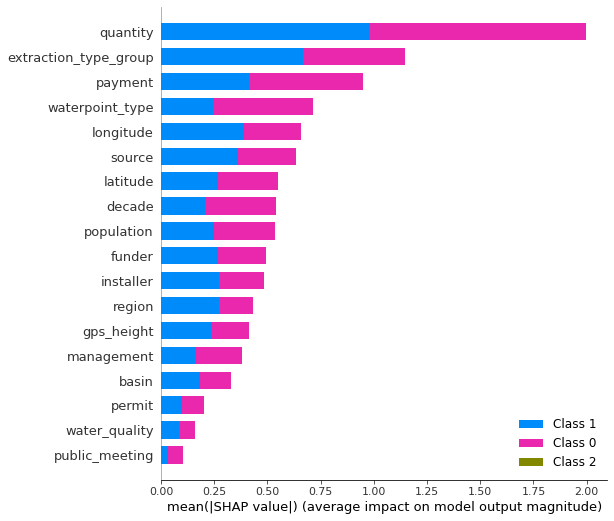

In [ ]:
# summarize the effects of all the features
shap.summary_plot(shap_values, X_train)